In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv("C:/Users/chand/Downloads/MNIST_CSV/mnist_train.csv")
df.head()

,5,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,...,0.608,0.609,0.610,0.611,0.612,0.613,0.614,0.615,0.616,0.617
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


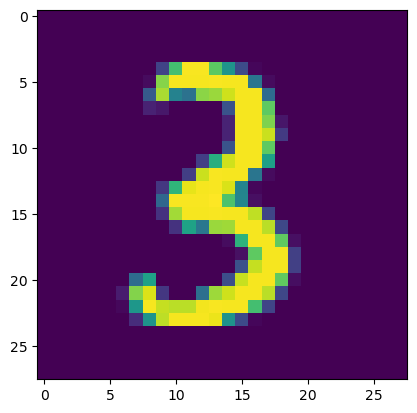

In [3]:
#This is what mnist digits look like
plt.imshow(df.iloc[18306,1:].values.reshape(28,28))

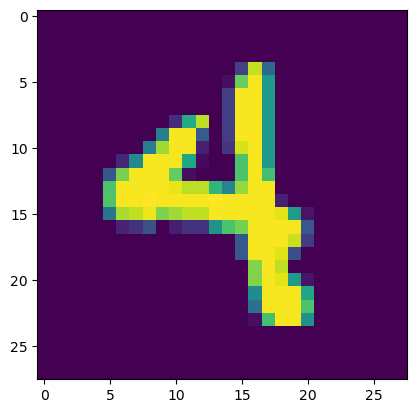

In [4]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

In [5]:
X = df.iloc[:,1:]
y = df.iloc[:,0]
X.shape

(59999, 784)

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

### We took 47999 images in training split from a total of 59999 images of mnist dataset

In [7]:
X_train.shape

(47999, 784)

In [8]:
#using Knn to cluster all the similar images and then assigning the label, this will cluster images
# of same digits together and will give them label.
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [9]:
y_pred = knn.predict(X_test)

In [10]:
#Calculaating accuracy of the knn algo for classifying the Mnist images.
accuracy_score(y_test, y_pred)

0.9686666666666667

# Now using PCA to do the same using less number of features

In [11]:
#scaling the data as scaled data increases the effectiveness of PCA by a lot (mean centring)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [22]:
#n_components in PCA() is used to define how many components we need, keeping it as none give us as many
#Components as the number of features in original data
pca = PCA(n_components = 100)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [23]:
X_train_trf.shape

(47999, 100)

In [24]:
knn = KNeighborsClassifier()
knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [25]:
y_pred = knn.predict(X_test_trf)

In [26]:
accuracy_score(y_test, y_pred)

0.9550833333333333

In [27]:
#Finding best number of principal components to get best accuracy
for i in range(1,785):
    pca = PCA(n_components = i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    knn = KNeighborsClassifier()
    knn.fit(X_train_trf, y_train)
    y_pred = knn.predict(X_test_trf)
    print(f'Accuracy with {i} principle components is: {accuracy_score(y_test, y_pred)}')

Accuracy with 1 principle components is: 0.25333333333333335
Accuracy with 2 principle components is: 0.3145
Accuracy with 3 principle components is: 0.50175
Accuracy with 4 principle components is: 0.6581666666666667
Accuracy with 5 principle components is: 0.7324166666666667
Accuracy with 6 principle components is: 0.8229166666666666
Accuracy with 7 principle components is: 0.8373333333333334
Accuracy with 8 principle components is: 0.8683333333333333
Accuracy with 9 principle components is: 0.8826666666666667
Accuracy with 10 principle components is: 0.9049166666666667
Accuracy with 11 principle components is: 0.91275
Accuracy with 12 principle components is: 0.9181666666666667
Accuracy with 13 principle components is: 0.9279166666666666
Accuracy with 14 principle components is: 0.9339166666666666
Accuracy with 15 principle components is: 0.9383333333333334
Accuracy with 16 principle components is: 0.93975
Accuracy with 17 principle components is: 0.942
Accuracy with 18 principle co

KeyboardInterrupt: 

### as we can see we get an accuracy of about 95.74% at 50 components and then the accuracy stops increasing, i.e we can drop our 728 dimnensional data to 50 dimensions without losing much info, this improves performance and showcases the usefull ness of PCA 

In [29]:
#transforming to a 2D coordinate system
pca = PCA(n_components = 2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [30]:
X_train_trf

array([[-4.56860172, -3.13654406],
       [-5.43204551,  1.93975271],
       [-3.10851029,  3.56784893],
       ...,
       [-0.6654747 , -8.04278317],
       [ 2.49420841, -5.47057388],
       [-7.6365319 , -1.3397406 ]])

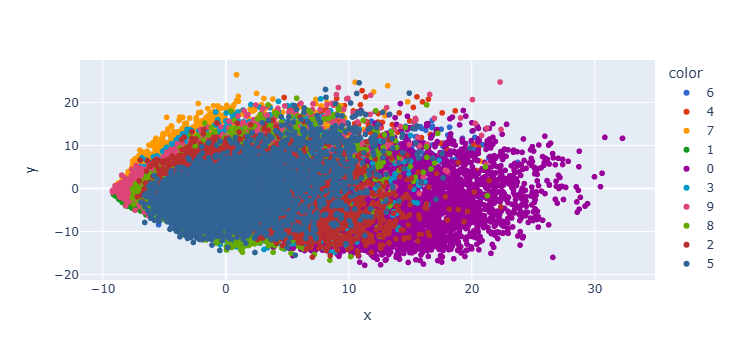

In [32]:
y_train_trf = y_train.astype(str)
fig = px.scatter(x = X_train_trf[:,0], y = X_train_trf[:,1], color = y_train_trf,
                color_discrete_sequence = px.colors.qualitative.G10)
fig.show()

In [33]:
#transforming to a 3D coordinate system
pca = PCA(n_components = 3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [34]:
X_train_trf

array([[-4.56860172, -3.13654406,  2.22540586],
       [-5.43204551,  1.93975271, -1.44379945],
       [-3.10851029,  3.56784893, -8.70685443],
       ...,
       [-0.6654747 , -8.04278317,  1.55810163],
       [ 2.49420841, -5.47057388,  2.38782624],
       [-7.6365319 , -1.3397406 ,  3.42157122]])

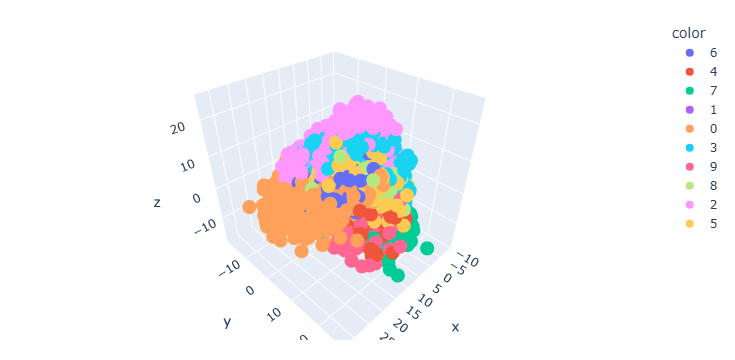

In [40]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df,x = X_train_trf[:,0], y = X_train_trf[:,1],
                 z = X_train_trf[:,2], color = y_train_trf)
fig.update_layout(margin = dict(l=20, r=20, t=20, b=20))
fig.show()

In [47]:
#explained variance is nothing but eigen values
pca.explained_variance_

array([40.56160135, 29.38115051, 26.84371288])

In [48]:
# components are our eigen vectors we get these after fitting our PCA
pca.components_

array([[-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

# How to find out optimum number of components #

In [51]:
#explained variance ratio gives us the %age of variance explained by each eigen value
pca.explained_variance_ratio_

array([0.05680778, 0.04114921, 0.03759545])

In [52]:
pca = PCA(n_components = None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [53]:
pca.explained_variance_.shape

(784,)

In [54]:
pca.components_.shape

(784, 784)

In [58]:
#calculating the cummulative sum of percent of variance explained by each eigen value
a = np.cumsum(pca.explained_variance_ratio_)

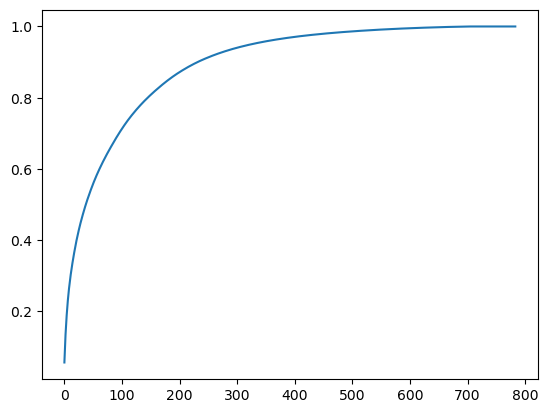

In [59]:
plt.plot(a)

### 90% of variance gets explained by ~200 components so that is the optimal number of components for this dataset